# Install libraries

In [4]:
!pip install catboost
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

#TODO: Restart Kernel in case of Google Colab

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


# Extract Images from ZIP

In [7]:
# import zipfile
# with zipfile.ZipFile('../content/img.zip', 'r') as zip_ref:
#    zip_ref.extractall('../content/img/')

# Import libraries

In [8]:
import random
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import sys
import PIL
import cv2
import re

import pandas_profiling
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import f_classif, mutual_info_classif

# keras
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import *
import albumentations

import nltk
from nltk.corpus import wordnet
from nltk.corpus import stopwords
from tqdm import tqdm
#import pymorphy2
from string import punctuation
from pymystem3 import Mystem
from sklearn.feature_extraction.text import TfidfVectorizer
nltk.download('stopwords')
nltk.download('wordnet')

# plt
import matplotlib.pyplot as plt
import seaborn as sns
#set default size for plots
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5
#plots quality is better in svg format
%config InlineBackend.figure_format = 'svg' 
%matplotlib inline

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [9]:
print('Python       :', sys.version.split('\n')[0])
print('Numpy        :', np.__version__)
print('Tensorflow   :', tf.__version__)
print('Pandas       :', pd.__version__)

Python       : 3.7.13 (default, Apr 24 2022, 01:04:09) 
Numpy        : 1.21.6
Tensorflow   : 2.8.0
Pandas       : 1.3.5


# Declare constants

In [10]:
# declare constants
RANDOM_SEED = 42
TEST_SIZE = 0.15 # size test data
LR = 0.5

np.random.seed(RANDOM_SEED)
x_size = 8
y_size = 5

# Declare classes

In [11]:
# DataAnalysis class provides a list of methods for data analysis
class EDA():

    def __init__(self, data, description):
        self.data = data  # data for analysis
        self.description = description  # brief data description

    # provide info about data
    def basic_info(self):
        self.display("Preview")
        display(self.data.sample(5))  # data preview

        self.display("Info")
        self.data.info()  # data info

        print('\n')
        print('Shape: {}'.format(self.data.shape))

        for column in self.data.columns:
            self.null_values_info(column)

    # do primary data analysis
    def primary_analysis(self):
        profile = pandas_profiling.ProfileReport(data)
        profile.to_notebook_iframe()

    # get info about column with null values
    def null_info(self, column):
        display(self.data[column].value_counts(dropna=False))
        mode = self.data[column].mode()[0]
        print('{} mode is \033[1m{}\033[0m'.format(column, mode))

    # get percent of null values in column
    def null_values_info(self, column):
        nanPercent = len(self.data[self.data[column].isnull()])/len(self.data)
        print('Percent nullable records in \033[1m{}\033[0m column: {:2.1%}'.format(
            column, nanPercent))
        return nanPercent

    # get outliers info
    def outlier_info(self, column):
        IQR = self.data[column].quantile(
            0.75) - self.data[column].quantile(0.25)
        perc25 = self.data[column].quantile(0.25)
        perc75 = self.data[column].quantile(0.75)

        ds = self.data.loc[self.data[column].between(
            perc25 - 1.5*IQR, perc75 + 1.5*IQR)]
        totalCount = len(self.data)
        outlierCount = totalCount - len(ds)

        print('\033[1mCOLUMN: {} \033[0m'.format(column))
        print('25%: {}.'.format(perc25))
        print('75%: {}.'.format(perc75))
        print('IQR: {}.'.format(IQR))
        print('Outlier ranges: [{f}, {l}].'.format(
            f=perc25 - 1.5*IQR, l=perc75 + 1.5*IQR))
        print('\033[1mOutlier count: {} from {} ({:.0%}).\033[0m'.format(
            outlierCount, totalCount, outlierCount/totalCount))
        print('\n')

    # get numeric columns
    def get_num_columns(self):
        num_cols = self.data.select_dtypes(include=[np.number]).columns
        return list(num_cols)

    # do variance analysis for numeric variables
    def numeric_variance_analysis(self, columns):
        for col in columns:
          self.data[col].dropna()

        imp_num = pd.Series(
            f_classif(self.data[columns], self.data['sample'])[0], index=columns)
        imp_num.sort_values(inplace=True)
        imp_num.plot(kind='barh', color='turquoise')

    # get categorial columns
    def get_cat_columns(self):
        cat_cols = self.data.select_dtypes(include=[object]).columns
        return list(cat_cols)

    # do variance analysis for string variables
    def variance_analysis(self, columns):
        imp_num = pd.Series(mutual_info_classif(self.data[columns], self.data['train'],
                                                discrete_features=True), index=columns)
        imp_num.sort_values(inplace=True)
        imp_num.plot(kind='barh', color='turquoise')

    # plot numeric column distribution
    def visualize_distributions(self, columns):
        col_count  = min(3,len(columns))
        rows = (len(columns) - 1) // col_count + 1
        fig = plt.figure(figsize = (len(columns) * 4, rows * 4))
        for i, (сolumn) in enumerate(columns):
            hist, bins = np.histogram(self.data[сolumn], bins = 20)
            ax = fig.add_subplot(rows, col_count, i + 1)
            ax.bar(bins[:-1], hist, width = (bins[1] - bins[0]) * 0.7)
            ax.set_title(columns[i])
        plt.show()

    # print text
    def display(self, text):
        print('\033[1m--- {}: {} ---\033[0m'.format(self.description.upper(), text))

# Declare functions

In [12]:
def mape(y_true, y_pred):
    """функция для определения целевой метрики"""
    return np.mean(np.abs((y_pred-y_true)/y_true))

In [13]:
!pip freeze > requirements.txt

# DATA

типы признаков:

* bodyType - категориальный
* brand - категориальный
* color - категориальный
* description - текстовый
* engineDisplacement - числовой, представленный как текст
* enginePower - числовой, представленный как текст
* fuelType - категориальный
* mileage - числовой
* modelDate - числовой
* model_info - категориальный
* name - категориальный, желательно сократить размерность
* numberOfDoors - категориальный
* price - числовой, целевой
* productionDate - числовой
* sell_id - изображение (файл доступен по адресу, основанному на sell_id)
* vehicleConfiguration - не используется (комбинация других столбцов)
* vehicleTransmission - категориальный
* Владельцы - категориальный
* Владение - числовой, представленный как текст
* ПТС - категориальный
* Привод - категориальный
* Руль - категориальный

In [14]:
# загружаем данные 
DATA_DIR = '../content/'
train = pd.read_csv(DATA_DIR + 'train.csv')
test = pd.read_csv(DATA_DIR + 'test.csv')
sample_submission = pd.read_csv(DATA_DIR + 'sample_submission.csv')

# Model 1: Native model
Forecast average price by model and production year.



In [15]:
# split данных
data_train, data_test = train_test_split(train, test_size=TEST_SIZE, shuffle=True, random_state=RANDOM_SEED)

In [16]:
# Baseline model
predicts = []
for index, row in pd.DataFrame(data_test[['model_info', 'productionDate']]).iterrows():
    query = f"model_info == '{row[0]}' and productionDate == {row[1]}"
    predicts.append(data_train.query(query)['price'].median())

# заполним не найденные совпадения
predicts = pd.DataFrame(predicts)
predicts = predicts.fillna(predicts.median())

# округлим
predicts = (predicts // 1000) * 1000

#оцениваем точность
print(f"Точность наивной модели по метрике MAPE: {(mape(data_test['price'], predicts.values[:, 0]))*100:0.2f}%")

Точность наивной модели по метрике MAPE: 19.88%


**Summary**:  
Accuracy **Native model** with MAPE: 19.88%

# EDA

In [17]:
train['sample'] = 1 # set train flag
test['sample'] = 0 # set test flag
test['price'] = 0 # set price in test dataset

In [18]:
data = pd.concat([train, test], join='inner', ignore_index=True)
print(train.shape, test.shape, data.shape)

(6682, 23) (1671, 23) (8353, 23)


## Basic info

In [19]:
eda = EDA(data, 'data')
eda.basic_info()

--- DATA: Preview ---


,bodyType,brand,color,description,engineDisplacement,enginePower,fuelType,mileage,modelDate,model_info,...,productionDate,sell_id,vehicleConfiguration,vehicleTransmission,Владельцы,Владение,ПТС,Привод,Руль,sample
7399,внедорожник 5 дв.,BMW,белый,Автодилер года 2020\n\nПобедитель в номинации ...,2.0 LTR,177 N12,дизель,144437,2009,X1,...,2011,1099879366,ALLROAD_5_DOORS AUTOMATIC 2.0,автоматическая,2 владельца,NaN,Оригинал,полный,Левый,0
4273,хэтчбек 5 дв.,BMW,чёрный,"Продаю а/м БМВ 118i, 136 л.с., 2017 года выпус...",1.5 LTR,136 N12,бензин,56094,2015,1ER,...,2017,1100201582,HATCHBACK_5_DOORS AUTOMATIC 1.5,автоматическая,1 владелец,NaN,Оригинал,задний,Левый,1
3362,внедорожник 5 дв.,MERCEDES,чёрный,"Автомобиль в идеальном состоянии, все исправно...",2.0 LTR,211 N12,бензин,133000,2012,GLK_KLASSE,...,2013,1099378480,ALLROAD_5_DOORS AUTOMATIC 2.0,автоматическая,2 владельца,NaN,Оригинал,полный,Левый,1
2794,внедорожник 5 дв.,AUDI,коричневый,Автомобиль в отличном состоянии .Бесключевой ...,2.0 LTR,225 N12,бензин,112584,2012,Q5,...,2014,1099193782,ALLROAD_5_DOORS AUTOMATIC 2.0,автоматическая,2 владельца,NaN,Оригинал,полный,Левый,1
5378,седан,MERCEDES,чёрный,Выгода до 82 000 руб. при обмене на Ваш автомо...,4.0 LTR,612 N12,бензин,16562,2016,E_KLASSE_AMG,...,2018,1099976030,SEDAN AUTOMATIC 4.0,автоматическая,2 владельца,NaN,Оригинал,полный,Левый,1


--- DATA: Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8353 entries, 0 to 8352
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   bodyType              8353 non-null   object 
 1   brand                 8353 non-null   object 
 2   color                 8353 non-null   object 
 3   description           8353 non-null   object 
 4   engineDisplacement    8353 non-null   object 
 5   enginePower           8353 non-null   object 
 6   fuelType              8353 non-null   object 
 7   mileage               8353 non-null   int64  
 8   modelDate             8353 non-null   int64  
 9   model_info            8353 non-null   object 
 10  name                  8353 non-null   object 
 11  numberOfDoors         8353 non-null   int64  
 12  price                 8353 non-null   float64
 13  productionDate        8353 non-null   int64  
 14  sell_id               8353 non-null   int64  
 15  ve

In [20]:
# search duplicates
len(data.drop_duplicates()) - len(data)

0

## Rename columns

In [21]:
# Rename columns
data.rename(columns={
    'Владельцы': 'owners',
    'Владение': 'ownership',
    'ПТС': 'vehicle_title',
    'Привод': 'drive_type',
    'Руль': 'wheel',
}, inplace=True)

## Primary Analysis

In [22]:
eda.primary_analysis()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [23]:
eda.get_num_columns()

['mileage',
 'modelDate',
 'numberOfDoors',
 'price',
 'productionDate',
 'sell_id',
 'sample']

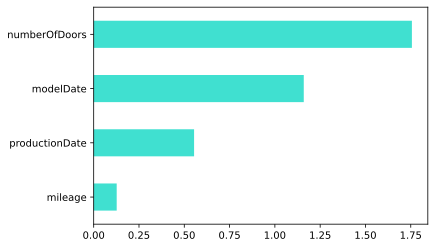

In [24]:
eda.numeric_variance_analysis(['mileage', 'modelDate', 'numberOfDoors', 'productionDate'])

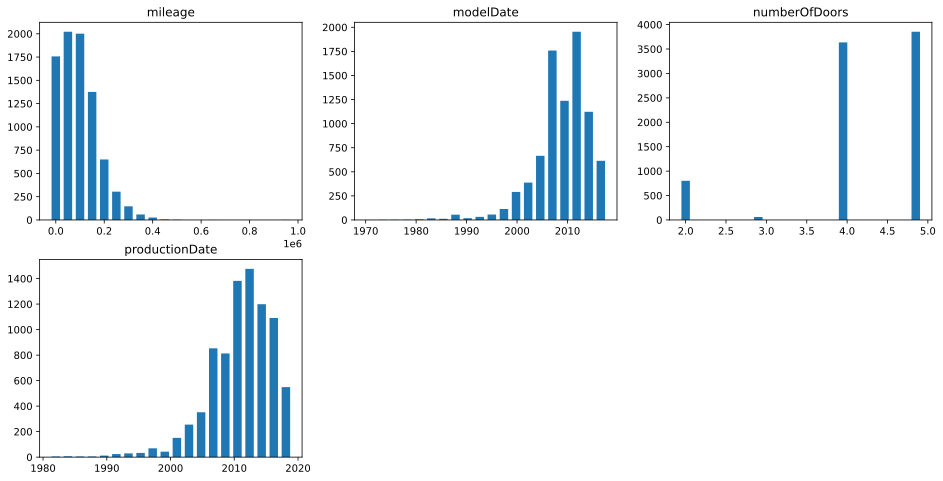

In [25]:
eda.visualize_distributions(['mileage', 'modelDate', 'numberOfDoors', 'productionDate'])

**Summary:**
* Числовые данные требуют логарифмирования, а затем нормироваия.
* Оценить кореляцию и удалить часть колонок, предварительно попытаясь извлечь из удаляемых колонок уникальную информацию.
* sell_id - код продавца, можно удалить  

## Deep Data Analysis

In [26]:
columns_to_remove = []

### Column: bodyType

In [27]:
data['bodyType'].unique()

array(['седан', 'лифтбек', 'внедорожник 5 дв.', 'хэтчбек 5 дв.',
       'минивэн', 'универсал 5 дв.', 'купе-хардтоп', 'купе', 'кабриолет',
       'родстер', 'хэтчбек 3 дв.', 'компактвэн', 'пикап двойная кабина',
       'внедорожник открытый', 'седан 2 дв.', 'внедорожник 3 дв.',
       'лимузин'], dtype=object)

In [28]:
# take firts word
data['bodyType'] = data['bodyType'].astype(str).apply(lambda x: None if x.strip() == '' else x)
data['bodyType'] = data.bodyType.apply(lambda x: x.split(' ')[0].lower())

data['bodyType'].value_counts()

седан           3542
внедорожник     2905
купе             543
хэтчбек          421
лифтбек          299
универсал        196
минивэн          178
купе-хардтоп     111
родстер           88
кабриолет         54
компактвэн         8
лимузин            5
пикап              3
Name: bodyType, dtype: int64

### Column: brand

In [29]:
data['brand'].unique()

array(['BMW', 'AUDI', 'MERCEDES'], dtype=object)

In [30]:
data['brand'].value_counts()

BMW         3535
MERCEDES    2846
AUDI        1972
Name: brand, dtype: int64

### Column: color

In [31]:
data['color'].unique()

array(['чёрный', 'серебристый', 'белый', 'синий', 'серый', 'красный',
       'коричневый', 'зелёный', 'голубой', 'пурпурный', 'бежевый',
       'фиолетовый', 'оранжевый', 'золотистый', 'жёлтый', 'розовый'],
      dtype=object)

In [32]:
data['color'].value_counts()

чёрный         3468
белый          1607
серый           925
синий           863
серебристый     420
коричневый      386
красный         266
голубой          91
зелёный          86
бежевый          85
фиолетовый       46
пурпурный        38
оранжевый        30
золотистый       24
жёлтый           17
розовый           1
Name: color, dtype: int64

### Column: description

In [33]:
data['description'].sample(10)

3640    Год выпуска: 2015. Пробег: 55 000 км. Кузов: х...
6421    ИДЕАЛЕН.Без окрасов и подкрасов и дтп, все в о...
7645    «Inchcape Certified-  Первый международный офи...
7222    -Оригинальный ПТС.  \t\n-Сервисное обслуживани...
4604    Продаю S4 1994 года, последний год выпуска S4 ...
5140    Машина пригнана из Германии в 2001 году, почти...
728     Бампера s line , фары рест ,линзы  bi led, мот...
7029    ID:40200\nКомплектация-xDrive 25d AT Business\...
1997    Внимание! Только для клиентов AVILON Автомобил...
3433    Забирал одним из последних в Москве в Автофору...
Name: description, dtype: object

### Column: engineDisplacement

In [34]:
data['engineDisplacement'].unique()

array(['3.0 LTR', '2.8 LTR', '3.5 LTR', '2.0 LTR', '1.8 LTR', '5.5 LTR',
       '2.5 LTR', '1.6 LTR', '1.5 LTR', '4.8 LTR', '4.4 LTR', '3.8 LTR',
       '2.2 LTR', '4.0 LTR', '2.1 LTR', '2.4 LTR', '4.7 LTR', '1.2 LTR',
       '3.6 LTR', '3.1 LTR', '0.7 LTR', '6.0 LTR', '4.1 LTR', '5.0 LTR',
       '5.4 LTR', '6.2 LTR', '4.2 LTR', '1.4 LTR', '2.9 LTR', '1.7 LTR',
       '3.2 LTR', '2.7 LTR', '1.9 LTR', '1.3 LTR', '5.2 LTR', '3.7 LTR',
       '5.9 LTR', '4.9 LTR', '2.3 LTR', '6.6 LTR', '3.4 LTR', '6.3 LTR',
       '2.6 LTR', 'undefined LTR', '5.6 LTR', '4.3 LTR', '4.6 LTR',
       '5.8 LTR'], dtype=object)

In [35]:
# extract numbers
data['engineDisplacement_value'] = data['engineDisplacement'].astype(str).apply(lambda x: x.split()[0])
# convert undefined to zero
data['engineDisplacement_value'] =  data['engineDisplacement_value'].replace('undefined', 0.0)
# change data type to float
data['engineDisplacement_value'] = data['engineDisplacement_value'].astype(float)

columns_to_remove.append('engineDisplacement')

### Column: enginePower

In [36]:
data['enginePower'].unique()

array(['272 N12', '204 N12', '306 N12', '180 N12', '160 N12', '184 N12',
       '197 N12', '326 N12', '190 N12', '245 N12', '224 N12', '585 N12',
       '211 N12', '225 N12', '218 N12', '156 N12', '231 N12', '238 N12',
       '140 N12', '150 N12', '360 N12', '122 N12', '555 N12', '249 N12',
       '95 N12', '136 N12', '163 N12', '407 N12', '469 N12', '388 N12',
       '544 N12', '177 N12', '170 N12', '455 N12', '105 N12', '280 N12',
       '367 N12', '340 N12', '400 N12', '233 N12', '265 N12', '450 N12',
       '333 N12', '290 N12', '300 N12', '192 N12', '143 N12', '390 N12',
       '269 N12', '408 N12', '240 N12', '200 N12', '320 N12', '258 N12',
       '435 N12', '115 N12', '120 N12', '558 N12', '235 N12', '476 N12',
       '525 N12', '279 N12', '420 N12', '239 N12', '575 N12', '422 N12',
       '507 N12', '193 N12', '605 N12', '116 N12', '271 N12', '220 N12',
       '310 N12', '102 N12', '355 N12', '350 N12', '210 N12', '82 N12',
       '462 N12', '125 N12', '313 N12', '557 N12', '2

In [37]:
# extract numbers
data['enginePower_value'] = data['enginePower'].str.split().apply(lambda x: x[0]) 
data['enginePower_value'] = data['enginePower_value'].apply(lambda x: int(x))

columns_to_remove.append('enginePower')

### Column: fuelType

In [38]:
data['fuelType'].unique()

array(['бензин', 'дизель', 'гибрид', 'электро'], dtype=object)

In [39]:
data['fuelType'].value_counts()

бензин     6018
дизель     2315
гибрид       14
электро       6
Name: fuelType, dtype: int64

### Column: model_info

In [40]:
data['model_info'].unique()

array(['5ER', 'A6', 'E_KLASSE', 'A5', 'C_KLASSE', '7ER', '3ER', 'X4',
       'M_KLASSE', 'S_KLASSE_AMG', 'Q5', 'CLA_KLASSE', 'GLA_CLASS', 'X1',
       'Q7', 'X2', 'X5', 'B_KLASSE', 'X6_M', 'S_KLASSE', 'VITO', 'A3',
       '1ER', 'CLS_KLASSE', 'X6', 'S_CLASS_MAYBACH', 'CL_KLASSE',
       'G_KLASSE_AMG', 'GLC_KLASSE', 'GLS_KLASSE', 'A8', 'A4',
       'GLE_KLASSE_COUPE_AMG', 'X3', 'Q3', 'X7', 'G_KLASSE',
       'GLS_KLASSE_AMG', 'I3', 'VIANO', 'GL_KLASSE', 'V_KLASSE',
       'SLK_KLASSE', 'GLC_COUPE', 'CLS_KLASSE_AMG', 'A_KLASSE', 'S7', '4',
       'A7', '6ER', 'RS6', 'M_KLASSE_AMG', 'GLK_KLASSE', 'R_KLASSE',
       'GLE_KLASSE', 'Z4', 'A1', 'C_KLASSE_AMG', 'GLE_KLASSE_AMG',
       'GLC_KLASSE_AMG', 'Z3', 'CLK_KLASSE', 'X5_M', 'M6', 'ALLROAD',
       'SLS_AMG', 'S5', '2GRANDTOURER', 'SL_KLASSE', 'E_KLASSE_AMG',
       'W124', 'GLE_KLASSE_COUPE', 'SLC_KLASSE', 'TT', 'S8',
       'CLA_KLASSE_AMG', 'R8', 'M5', '2ER', 'RSQ3', 'S4', 'CL_KLASSE_AMG',
       'Q8', 'AMG_GT', 'GLA_CLASS_AMG', 'M4'

In [41]:
data['model_info'].value_counts()

5ER         776
3ER         578
X5          501
E_KLASSE    490
A6          433
           ... 
100           1
CITAN         1
SQ7           1
Z8            1
COUPE         1
Name: model_info, Length: 122, dtype: int64

### Column: name

In [42]:
data['name'].sample(50)

423               20d xDrive 2.0d AT (190 л.с.) 4WD
1079               8tiptronic 2.0 AT (211 л.с.) 4WD
4964                         323i 2.5 MT (170 л.с.)
1509                          200 2.0 AT (184 л.с.)
7186                 500 Long 4.7 AT (455 л.с.) 4WD
2891                 500 Long 4.7 AT (435 л.с.) 4WD
4215                     30d 3.0d AT (235 л.с.) 4WD
1382                        740Li 4.0 AT (306 л.с.)
3995                      350 3.5 AT (272 л.с.) 4WD
4689                      500 5.5 AT (388 л.с.) 4WD
6850                      500 5.5 AT (388 л.с.) 4WD
7357                         116i 1.6 AT (115 л.с.)
2798                          3.2 AT (271 л.с.) 4WD
3867                      300 3.0 AT (231 л.с.) 4WD
4442                          3.2 AT (265 л.с.) 4WD
1493                             5.0 AMT (507 л.с.)
3498                         220 2.2d AT (150 л.с.)
784                  350 CDI 3.0d AT (258 л.с.) 4WD
3964                   300 d 2.0d AT (245 л.с.) 4WD
889         

In [43]:
data['name_xDrive'] = data['name'].apply(lambda x: 1 if 'xDrive' in x else 0)

In [44]:
# remove it as this info exists in other columns
columns_to_remove.append('name')

### Column: vehicleConfiguration

In [45]:
data['vehicleConfiguration'].unique()

array(['SEDAN AUTOMATIC 3.0', 'SEDAN VARIATOR 2.8', 'SEDAN AUTOMATIC 3.5',
       'SEDAN VARIATOR 2.0', 'LIFTBACK VARIATOR 1.8',
       'SEDAN AUTOMATIC 1.8', 'SEDAN AUTOMATIC 2.0', 'SEDAN ROBOT 1.8',
       'LIFTBACK AUTOMATIC 2.0', 'ALLROAD_5_DOORS AUTOMATIC 2.0',
       'ALLROAD_5_DOORS AUTOMATIC 3.0', 'SEDAN AUTOMATIC 5.5',
       'ALLROAD_5_DOORS ROBOT 2.0', 'LIFTBACK ROBOT 2.0',
       'SEDAN AUTOMATIC 2.5', 'SEDAN ROBOT 1.6', 'SEDAN ROBOT 3.0',
       'ALLROAD_5_DOORS ROBOT 1.5', 'ALLROAD_5_DOORS AUTOMATIC 4.8',
       'HATCHBACK_5_DOORS ROBOT 1.6', 'ALLROAD_5_DOORS AUTOMATIC 4.4',
       'SEDAN ROBOT 2.0', 'SEDAN AUTOMATIC 3.8', 'MINIVAN MECHANICAL 2.2',
       'ALLROAD_5_DOORS AUTOMATIC 3.5', 'SEDAN AUTOMATIC 1.6',
       'HATCHBACK_5_DOORS AUTOMATIC 1.6', 'WAGON_5_DOORS AUTOMATIC 3.5',
       'SEDAN AUTOMATIC 4.0', 'COUPE_HARDTOP AUTOMATIC 5.5',
       'ALLROAD_5_DOORS AUTOMATIC 5.5', 'COUPE MECHANICAL 1.8',
       'ALLROAD_5_DOORS AUTOMATIC 2.1', 'SEDAN VARIATOR 2.4',
      

In [46]:
# remove it as this info exists in other columns
columns_to_remove.append('vehicleConfiguration')

### Column: vehicleTransmission

In [47]:
data['vehicleTransmission'].unique()

array(['автоматическая', 'вариатор', 'роботизированная', 'механическая'],
      dtype=object)

In [48]:
data['vehicleTransmission'].value_counts()

автоматическая      6560
роботизированная    1201
вариатор             406
механическая         186
Name: vehicleTransmission, dtype: int64

### Column: owners

In [49]:
data['owners'].unique()

array(['3 или более', '2\xa0владельца', '1\xa0владелец', nan],
      dtype=object)

In [50]:
data['owners'].value_counts()

3 или более    3311
1 владелец     2526
2 владельца    2515
Name: owners, dtype: int64

In [51]:
#fill NA
data['owners'].fillna('3 или более', inplace = True)

### Column: ownership

In [52]:
data['ownership'].sample(10)

2053                   NaN
6756    2 года и 7 месяцев
5053                   NaN
2238                   NaN
967       1 год и 3 месяца
2135     3 года и 3 месяца
6841     5 лет и 8 месяцев
5362                   NaN
4331    2 года и 6 месяцев
3018                   NaN
Name: ownership, dtype: object

In [53]:
data['ownership'].value_counts()

1 год и 2 месяца       67
1 год и 8 месяцев      67
1 год                  55
1 год и 10 месяцев     52
2 года и 2 месяца      52
                       ..
27 лет и 10 месяцев     1
14 лет и 8 месяцев      1
17 лет и 4 месяца       1
11 лет и 1 месяц        1
16 лет и 1 месяц        1
Name: ownership, Length: 180, dtype: int64

In [54]:
# remove it as it has 64.9% of nullable values
columns_to_remove.append('ownership')

### Column: vehicle_title

In [55]:
data['vehicle_title'].unique()

array(['Оригинал', 'Дубликат'], dtype=object)

In [56]:
data['vehicle_title'].value_counts()

Оригинал    7474
Дубликат     879
Name: vehicle_title, dtype: int64

### Column: drive_type

In [57]:
data['drive_type'].unique()

array(['полный', 'передний', 'задний'], dtype=object)

In [58]:
data['drive_type'].value_counts()

полный      5218
задний      2259
передний     876
Name: drive_type, dtype: int64

### Column: wheel

In [59]:
data['wheel'].unique()

array(['Левый', 'Правый'], dtype=object)

In [60]:
data['wheel'].value_counts()

Левый     8351
Правый       2
Name: wheel, dtype: int64

In [61]:
# remove it as the variability values is very low 
columns_to_remove.append('wheel')

## Data Cleanup & Frature Engineering

In [62]:
#drop columns
data.drop(columns_to_remove, axis=1, inplace=True)

In [63]:
# generate new features 
from datetime import date
# car age
data['age'] = date.today().year - data['productionDate']
# mileage per year
data['mileage_per_year'] = data['mileage'] / data['age']

In [64]:
data.sample(10)

,bodyType,brand,color,description,fuelType,mileage,modelDate,model_info,numberOfDoors,price,...,vehicleTransmission,owners,vehicle_title,drive_type,sample,engineDisplacement_value,enginePower_value,name_xDrive,age,mileage_per_year
5624,седан,AUDI,белый,Безопасность: 7. Обзор: 3. Комфорт: 5. Салон: ...,бензин,111625,2015,A4,4,1223000.0,...,роботизированная,1 владелец,Оригинал,передний,1,1.4,150,0,6,18604.166667
5688,внедорожник,BMW,синий,Автомобиль в идеальном состоянии. Стоят аморти...,дизель,72000,2013,X5,5,2870000.0,...,автоматическая,1 владелец,Оригинал,полный,1,3.0,381,0,9,8000.000000
5111,внедорожник,BMW,чёрный,РОЛЬФ Премиум – крупнейший официальный дилер М...,бензин,2441,2017,X2,5,2297000.0,...,роботизированная,1 владелец,Оригинал,передний,1,2.0,190,0,3,813.666667
6967,внедорожник,BMW,белый,Продажа автомобиля в связи с приобретением нов...,бензин,135000,2010,X3,5,0.0,...,автоматическая,2 владельца,Оригинал,полный,0,2.0,245,1,10,13500.000000
2624,внедорожник,BMW,белый,"BMW X1 владелец жена,эксплуатировалась в одних...",бензин,66037,2012,X1,5,1200000.0,...,автоматическая,1 владелец,Оригинал,задний,1,2.0,150,0,9,7337.444444
191,внедорожник,AUDI,синий,"Автомобиль в хорошем состояние, своевременно о...",бензин,130000,2008,Q5,5,780000.0,...,роботизированная,3 или более,Дубликат,полный,1,2.0,211,0,12,10833.333333
7702,внедорожник,BMW,чёрный,Автомобиль продаётся официальным дилером BMW -...,дизель,83609,2013,X5,5,0.0,...,автоматическая,1 владелец,Оригинал,полный,0,3.0,381,0,8,10451.125000
720,внедорожник,BMW,чёрный,Комфорт: 5. Безопасность: 4. Обзор: 4. Защита ...,дизель,63040,2013,X5,5,3250000.0,...,автоматическая,2 владельца,Оригинал,полный,1,3.0,249,0,6,10506.666667
4359,седан,BMW,чёрный,Короткая полноприводная версия в пакете Pure E...,бензин,33000,2015,7ER,4,2950000.0,...,автоматическая,1 владелец,Оригинал,полный,1,4.4,450,1,7,4714.285714
1682,внедорожник,MERCEDES,чёрный,Куплен у официального дилера в Москве. Очень х...,бензин,140000,2006,GL_KLASSE,5,849000.0,...,автоматическая,3 или более,Оригинал,полный,1,4.7,340,0,13,10769.230769


In [65]:
data.drop(['modelDate'], axis=1, inplace=True)

In [66]:
eda.primary_analysis()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [67]:
# remove highly correlated columns
data.drop(['mileage','engineDisplacement_value', 'productionDate'], axis=1, inplace=True)

In [68]:
eda.primary_analysis()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [69]:
num_columns = list(eda.get_num_columns())
cat_columns = list(eda.get_cat_columns())

num_columns, cat_columns

(['numberOfDoors',
  'price',
  'sell_id',
  'sample',
  'enginePower_value',
  'name_xDrive',
  'age',
  'mileage_per_year'],
 ['bodyType',
  'brand',
  'color',
  'description',
  'fuelType',
  'model_info',
  'vehicleTransmission',
  'owners',
  'vehicle_title',
  'drive_type'])

In [70]:
cat_columns.remove('description')
num_columns.remove('price')
num_columns.remove('sample')

In [71]:
# check outliers 
for col in num_columns:
  eda.outlier_info(col)

COLUMN: numberOfDoors 
25%: 4.0.
75%: 5.0.
IQR: 1.0.
Outlier ranges: [2.5, 6.5].
Outlier count: 802 from 8353 (10%).


COLUMN: sell_id 
25%: 1097085896.0.
75%: 1099975262.0.
IQR: 2889366.0.
Outlier ranges: [1092751847.0, 1104309311.0].
Outlier count: 891 from 8353 (11%).


COLUMN: enginePower_value 
25%: 184.0.
75%: 306.0.
IQR: 122.0.
Outlier ranges: [1.0, 489.0].
Outlier count: 493 from 8353 (6%).


COLUMN: name_xDrive 
25%: 0.0.
75%: 0.0.
IQR: 0.0.
Outlier ranges: [0.0, 0.0].
Outlier count: 939 from 8353 (11%).


COLUMN: age 
25%: 6.0.
75%: 13.0.
IQR: 7.0.
Outlier ranges: [-4.5, 23.5].
Outlier count: 144 from 8353 (2%).


COLUMN: mileage_per_year 
25%: 7800.0.
75%: 15111.111111111111.
IQR: 7311.111111111111.
Outlier ranges: [-3166.666666666668, 26077.77777777778].
Outlier count: 124 from 8353 (1%).




In [72]:
num_columns.remove('sell_id')

# Model 2: CatBoostRegressor
(градиентный бустинг)

In [73]:
# declare function for preprocessing data
def preproc_data_cbr(df_input):
    df_output = df_input.copy()
    
    # log for numeric features
    for col in df_output[num_columns]:
       df_output[col] = df_output[col].apply(lambda x: np.log(x) if x>0 else x)

    # remove description, sell_id
    df_output.drop(['description', 'sell_id'], axis = 1, inplace=True)
    
     
    # fill nullable values
    for column in num_columns:
        df_output[column].fillna(df_output[column].median(), inplace=True)

    # normalization
    scaler = MinMaxScaler()
    for column in num_columns:
        df_output[column] = scaler.fit_transform(df_output[[column]])[:,0]
    
    # label encoding
    for column in cat_columns:
        df_output[column] = df_output[column].astype('category').cat.codes
        
    # One-Hot Encoding
    df_output = pd.get_dummies(df_output, columns=cat_columns, dummy_na=False)
    
    return df_output

In [74]:
# run pre-processing
df = preproc_data_cbr(data)
df.sample(10)

,numberOfDoors,price,sample,enginePower_value,name_xDrive,age,mileage_per_year,bodyType_0,bodyType_1,bodyType_2,...,vehicleTransmission_2,vehicleTransmission_3,owners_0,owners_1,owners_2,vehicle_title_0,vehicle_title_1,drive_type_0,drive_type_1,drive_type_2
4335,1.000000,760000.0,1,0.477709,0.0,0.649561,0.904163,1,0,0,...,0,0,0,0,1,1,0,0,0,1
5143,0.756471,649900.0,1,0.605479,0.0,0.624823,0.889944,0,0,0,...,0,0,0,1,0,0,1,0,0,1
4068,1.000000,1429000.0,1,0.511328,0.0,0.598104,0.849868,1,0,0,...,0,0,0,0,1,0,1,0,0,1
8089,0.756471,0.0,0,0.447992,0.0,0.569059,0.918139,0,0,0,...,0,0,1,0,0,0,1,1,0,0
7193,0.756471,0.0,0,0.477709,0.0,0.694135,0.860258,0,0,0,...,0,0,0,0,1,1,0,0,0,1
5158,0.000000,1269000.0,1,0.491859,0.0,0.462756,0.826482,0,0,0,...,0,1,0,0,1,0,1,0,0,1
7289,0.756471,0.0,0,0.266462,0.0,0.305865,0.800934,0,0,0,...,0,0,0,1,0,0,1,1,0,0
4149,0.000000,1660000.0,1,0.463097,0.0,0.462756,0.814559,0,0,0,...,0,0,1,0,0,0,1,1,0,0
7213,0.756471,0.0,0,0.266462,0.0,0.569059,0.871391,0,0,0,...,0,0,0,0,1,1,0,1,0,0
3157,0.756471,2833000.0,1,0.537235,0.0,0.418183,0.900949,0,0,0,...,0,0,1,0,0,1,0,0,0,1


In [75]:
# split on train and test datasets
train_data = df.query('sample == 1').drop(['sample'], axis=1)
test_data = df.query('sample == 0').drop(['sample'], axis=1)

y = train_data.price.values     # target
X = train_data.drop(['price'], axis=1)
X_sub = test_data.drop(['price'], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=TEST_SIZE, shuffle=True, random_state=RANDOM_SEED)

In [76]:
model2 = CatBoostRegressor(
      iterations = 5000,
      random_seed = RANDOM_SEED,
      eval_metric='MAPE',
      custom_metric=['RMSE', 'MAE'],
      od_wait=500
  )

model2.fit(
      X_train, 
      y_train,
      eval_set=(X_test, y_test),
      verbose_eval=100,
      use_best_model=True
  )

Learning rate set to 0.025058
0:	learn: 0.9856840	test: 1.0096907	best: 1.0096907 (0)	total: 49ms	remaining: 4m 4s
100:	learn: 0.2865341	test: 0.2863258	best: 0.2863258 (100)	total: 327ms	remaining: 15.9s
200:	learn: 0.2211612	test: 0.2194515	best: 0.2193938 (197)	total: 590ms	remaining: 14.1s
300:	learn: 0.1923978	test: 0.1915468	best: 0.1915468 (300)	total: 875ms	remaining: 13.7s
400:	learn: 0.1796948	test: 0.1808882	best: 0.1808853 (399)	total: 1.14s	remaining: 13.1s
500:	learn: 0.1734611	test: 0.1755417	best: 0.1755417 (500)	total: 1.42s	remaining: 12.7s
600:	learn: 0.1656548	test: 0.1686024	best: 0.1686024 (600)	total: 1.69s	remaining: 12.4s
700:	learn: 0.1596704	test: 0.1633839	best: 0.1633617 (696)	total: 1.95s	remaining: 12s
800:	learn: 0.1553222	test: 0.1600543	best: 0.1600543 (800)	total: 2.23s	remaining: 11.7s
900:	learn: 0.1508714	test: 0.1571579	best: 0.1571467 (899)	total: 2.5s	remaining: 11.4s
1000:	learn: 0.1470695	test: 0.1549738	best: 0.1549738 (1000)	total: 2.77s	rem

In [77]:
model2_predict_test = model2.predict(X_test)
print(f"TEST mape: {(mape(y_test, model2_predict_test))*100:0.2f}%")

TEST mape: 13.24%


In [80]:
model2_predict_sub = model2.predict(X_sub)
sample_submission['price'] = model2_predict_sub
sample_submission.to_csv(DATA_DIR + 'submissions/submission_model2_catboost.csv', index=False)

**Summary**:  
Accuracy **CatBoostRegressor** with MAPE: 13.24% (native MAPE: 19.88%)

# Model 3: Tabular NN

In [81]:
def preproc_data_nn(df_input):
    '''includes several functions to pre-process the predictor data.'''
    df_output = df_input.copy()

    # remove description
    df_output.drop(['description', 'sell_id'], axis = 1, inplace=True)
        
    # fill nullable values and log them
    for column in num_columns:
        df_output[column].fillna(df_output[column].median(), inplace=True)
        df_output[column] = np.log(df_output[column] +1)

    # normalization
    scaler = MinMaxScaler()
    for column in num_columns:
        df_output[column] = scaler.fit_transform(df_output[[column]])[:,0]
    
    # label encoding
    for column in cat_columns:
        df_output[column] = df_output[column].astype('category').cat.codes
        
    # One-Hot Encoding
    df_output = pd.get_dummies(df_output, columns=cat_columns, dummy_na=False)
    
    return df_output

In [82]:
df = preproc_data_nn(data)
df.sample(10)

,numberOfDoors,price,sample,enginePower_value,name_xDrive,age,mileage_per_year,bodyType_0,bodyType_1,bodyType_2,...,vehicleTransmission_2,vehicleTransmission_3,owners_0,owners_1,owners_2,vehicle_title_0,vehicle_title_1,drive_type_0,drive_type_1,drive_type_2
7497,0.736966,0.0,0,0.265215,0.0,0.530140,0.804197,0,0,0,...,0,0,0,0,1,0,1,1,0,0
912,1.000000,400000.0,1,0.648449,0.0,0.705872,0.861816,1,0,0,...,0,0,0,0,1,0,1,0,0,1
3972,1.000000,3555555.0,1,0.535935,0.0,0.324019,0.838161,1,0,0,...,0,0,1,0,0,0,1,0,0,1
1689,1.000000,2767000.0,1,0.446614,0.0,0.265070,0.768402,1,0,0,...,0,0,1,0,0,0,1,0,0,1
5249,1.000000,1330000.0,1,0.461727,0.0,0.420126,0.814617,1,0,0,...,0,1,0,0,1,0,1,0,0,1
5402,0.736966,1550000.0,1,0.414777,0.0,0.375084,0.847421,0,0,0,...,0,1,1,0,0,1,0,0,1,0
7696,1.000000,0.0,0,0.490510,0.0,0.460417,0.863415,0,0,0,...,0,1,0,0,1,0,1,0,0,1
4614,1.000000,2160000.0,1,0.400411,1.0,0.265070,0.764871,0,0,0,...,0,0,0,1,0,0,1,0,0,1
4137,1.000000,550000.0,1,0.287644,0.0,0.615473,0.887929,0,0,0,...,0,0,0,1,0,0,1,0,1,0
1686,1.000000,1800000.0,1,0.519433,0.0,0.496865,0.813884,1,0,0,...,0,0,1,0,0,0,1,0,0,1


In [83]:
# split on train and test datasets
train_data = df.query('sample == 1').drop(['sample'], axis=1)
test_data = df.query('sample == 0').drop(['sample'], axis=1)

y = train_data.price.values     # target
X = train_data.drop(['price'], axis=1)
X_sub = test_data.drop(['price'], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=TEST_SIZE, shuffle=True, random_state=RANDOM_SEED)

## Simple Dense NN

In [84]:
model3 = Sequential()
model3.add(L.Dense(512, input_dim=X_train.shape[1], activation="relu"))
model3.add(L.Dropout(0.5))
model3.add(L.Dense(256, activation="relu"))
model3.add(L.Dropout(0.5))
model3.add(L.Dense(1, activation="linear"))

In [85]:
model3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               90112     
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 1)                 257       
                                                                 
Total params: 221,697
Trainable params: 221,697
Non-trainable params: 0
_________________________________________________________________


In [86]:
# compile model
optimizer = tf.keras.optimizers.Adam(0.01)
model3.compile(loss='MAPE',optimizer=optimizer, metrics=['MAPE'])

In [87]:
# add checkpoint
checkpoint = ModelCheckpoint(DATA_DIR + 'checkpoints/best_model3.hdf5' , monitor=['val_MAPE'], verbose=0  , mode='min')
earlystop = EarlyStopping(monitor='val_MAPE', patience=50, restore_best_weights=True,)
callbacks_list = [checkpoint, earlystop]

In [88]:
%%time
history = model3.fit(X_train, y_train,
                    batch_size=512,
                    epochs=500,
                    validation_data=(X_test, y_test),
                    callbacks=callbacks_list,
                    verbose=0,
                   )

CPU times: user 53 s, sys: 8.55 s, total: 1min 1s
Wall time: 1min 22s


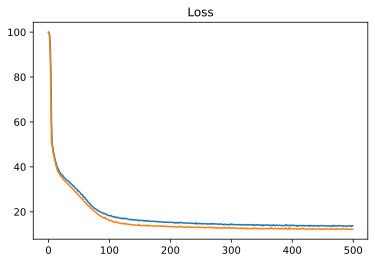

In [89]:
plt.title('Loss')
plt.plot(history.history['MAPE'], label='train')
plt.plot(history.history['val_MAPE'], label='test')
plt.show();

In [90]:
model3_predict_test = model3.predict(X_test)
print(f"TEST mape: {(mape(y_test, model3_predict_test[:,0]))*100:0.2f}%")

TEST mape: 12.26%


In [91]:
model3_predict_sub = model3.predict(X_sub)
sample_submission['price'] = model3_predict_sub
sample_submission.to_csv(DATA_DIR + '/submissions/submission_model3_nn.csv', index=False)

**Summary**:  
Accuracy **Tabular NN** with MAPE: 12.26% (native MAPE: 19.88%)

# Model 4: NLP + Multiple Inputs

In [92]:
data.description.sample(10)

6374    РОЛЬФ - Официальный дилер и Лучший дилер Росси...
6266    Покупал в автосалоне в 2015 году. До меня влад...
2574    Авто в полной комплектации! Хорошее состояние!...
7870    Легендарный автомобиль в коллекционном состоян...
6578     Рассматриваю варианты обмена GL GLS\n2015-2017 г
5550    Машина еще пахнет новой, вся передняя часть, а...
2931    Продаю свой автомобиль. Комплектация предмакси...
6061    Продаю Мерседес Е-320!✅\nочень хорошую машину ...
1824    Автодилер года 2020\n\nПобедитель в номинации ...
507     Выгода до 82 000 руб. при обмене на Ваш автомо...
Name: description, dtype: object

In [93]:
# lemmatization
mystem = Mystem() 
russian_stopwords = stopwords.words("russian")

def preproc_text_lemmatize(text):
    """function for text pre-processing"""
    tokens = mystem.lemmatize(text.lower())
    tokens = [token for token in tokens if token not in russian_stopwords\
             and token != " " \
             and token.strip() not in punctuation]
    text = " ".join(tokens)

    return text

Installing mystem to /root/.local/bin/mystem from http://download.cdn.yandex.net/mystem/mystem-3.1-linux-64bit.tar.gz


In [94]:
# TOKENIZER
# max words by using
MAX_WORDS = 100000
# max words in a row
MAX_SEQUENCE_LENGTH = 256

In [95]:
df = preproc_data_nn(data)

# comment is as lemmatization did not give better results
#df['description'] = data['description'].apply(preproc_text_lemmatize)


In [96]:
# split on train and test datasets
train_data = df.query('sample == 1').drop(['sample'], axis=1)
test_data = df.query('sample == 0').drop(['sample'], axis=1)

y = train_data.price.values     # target
X = train_data.drop(['price'], axis=1)
X_sub = test_data.drop(['price'], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=TEST_SIZE, shuffle=True, random_state=RANDOM_SEED)

In [97]:
# split данных
text_train = data.description.iloc[X_train.index]
text_test = data.description.iloc[X_test.index]
text_sub = data.description.iloc[X_sub.index]

In [98]:
# tokenizer
%%time
tokenize = Tokenizer(num_words=MAX_WORDS)
tokenize.fit_on_texts(data.description)

CPU times: user 2.79 s, sys: 33 ms, total: 2.83 s
Wall time: 5.33 s


In [99]:
tokenize.word_index

{'•': 1,
 'в': 2,
 'и': 3,
 'с': 4,
 'на': 5,
 'не': 6,
 'по': 7,
 'система': 8,
 'автомобиль': 9,
 'все': 10,
 'для': 11,
 'автомобиля': 12,
 'от': 13,
 'до': 14,
 'при': 15,
 'у': 16,
 'пробегом': 17,
 '2': 18,
 'состоянии': 19,
 'без': 20,
 'авто': 21,
 'салон': 22,
 'пакет': 23,
 'за': 24,
 'машина': 25,
 'автомобилей': 26,
 'сидений': 27,
 'птс': 28,
 'безопасности': 29,
 'то': 30,
 'bmw': 31,
 'из': 32,
 'более': 33,
 '000': 34,
 'автомобили': 35,
 'водителя': 36,
 'комплектация': 37,
 'есть': 38,
 '1': 39,
 'года': 40,
 'комплект': 41,
 'сиденья': 42,
 'только': 43,
 'дилера': 44,
 'салона': 45,
 'пробег': 46,
 'контроль': 47,
 'фары': 48,
 '6': 49,
 'кредит': 50,
 'диски': 51,
 'лет': 52,
 'передние': 53,
 '3': 54,
 'руля': 55,
 'датчик': 56,
 'пассажира': 57,
 'км': 58,
 'оригинал': 59,
 'подушки': 60,
 'а': 61,
 'мы': 62,
 '9': 63,
 'подогрев': 64,
 'состояние': 65,
 'заднего': 66,
 'вас': 67,
 '5': 68,
 'обслуживание': 69,
 'зеркал': 70,
 '–': 71,
 'торг': 72,
 'дтп': 73,
 '

In [100]:
%%time
text_train_sequences = sequence.pad_sequences(tokenize.texts_to_sequences(text_train), maxlen=MAX_SEQUENCE_LENGTH)
text_test_sequences = sequence.pad_sequences(tokenize.texts_to_sequences(text_test), maxlen=MAX_SEQUENCE_LENGTH)
text_sub_sequences = sequence.pad_sequences(tokenize.texts_to_sequences(text_sub), maxlen=MAX_SEQUENCE_LENGTH)

print(text_train_sequences.shape, text_test_sequences.shape, text_sub_sequences.shape)

(5679, 256) (1003, 256) (1671, 256)
CPU times: user 2.48 s, sys: 9.87 ms, total: 2.49 s
Wall time: 3.32 s


In [101]:
# preview text after tokenize
print(text_train.iloc[1])
print(text_train_sequences[1])

Очень красивый, практически новый автомобиль. Кузов в идеальном состоянии, так как машина была полностью оклеена (включая лобовое стекло) полеуретановой защитной пленкой сразу после покупки.
Торга нет.
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0  

### RNN NLP

In [102]:
model_nlp = Sequential()
model_nlp.add(L.Input(shape=MAX_SEQUENCE_LENGTH, name="seq_description"))
model_nlp.add(L.Embedding(len(tokenize.word_index)+1, MAX_SEQUENCE_LENGTH,))
model_nlp.add(L.LSTM(256, return_sequences=True))
model_nlp.add(L.Dropout(0.5))
model_nlp.add(L.LSTM(128,))
model_nlp.add(L.Dropout(0.25))
model_nlp.add(L.Dense(64, activation="relu"))
model_nlp.add(L.Dropout(0.25))

### MLP

In [103]:
model_mlp = Sequential()
model_mlp.add(L.Dense(512, input_dim=X_train.shape[1], activation="relu"))
model_mlp.add(L.Dropout(0.5))
model_mlp.add(L.Dense(256, activation="relu"))
model_mlp.add(L.Dropout(0.5))

### Multiple Inputs NN

In [104]:
combinedInput = L.concatenate([model_nlp.output, model_mlp.output])
# being our regression head
head = L.Dense(64, activation="relu")(combinedInput)
head = L.Dense(1, activation="linear")(head)

model4 = Model(inputs=[model_nlp.input, model_mlp.input], outputs=head)
model4.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 seq_description (InputLayer)   [(None, 256)]        0           []                               
                                                                                                  
 embedding (Embedding)          (None, 256, 256)     10135552    ['seq_description[0][0]']        
                                                                                                  
 lstm (LSTM)                    (None, 256, 256)     525312      ['embedding[0][0]']              
                                                                                                  
 dropout_2 (Dropout)            (None, 256, 256)     0           ['lstm[0][0]']                   
                                                                                              

In [105]:
#compline model
optimizer = tf.keras.optimizers.Adam(0.01)
model4.compile(loss='MAPE',optimizer=optimizer, metrics=['MAPE'])

In [106]:
# add checkpoint
checkpoint = ModelCheckpoint(DATA_DIR + 'checkpoints/best_model4.hdf5', monitor=['val_MAPE'], verbose=0, mode='min')
earlystop = EarlyStopping(monitor='val_MAPE', patience=10, restore_best_weights=True)
callbacks_list = [checkpoint, earlystop]

In [107]:
X_train.sample(5)

,numberOfDoors,enginePower_value,name_xDrive,age,mileage_per_year,bodyType_0,bodyType_1,bodyType_2,bodyType_3,bodyType_4,...,vehicleTransmission_2,vehicleTransmission_3,owners_0,owners_1,owners_2,vehicle_title_0,vehicle_title_1,drive_type_0,drive_type_1,drive_type_2
6123,0.736966,0.364992,0.0,0.560749,0.892141,0,0,0,0,0,...,1,0,0,1,0,0,1,1,0,0
2950,1.000000,0.502303,0.0,0.685196,0.859296,1,0,0,0,0,...,0,0,0,1,0,0,1,0,0,1
6097,1.000000,0.709950,0.0,0.496865,0.838661,1,0,0,0,0,...,0,0,0,1,0,0,1,0,0,1
5955,0.000000,0.400411,0.0,0.324019,0.710612,0,0,0,0,0,...,0,0,0,0,1,0,1,1,0,0
2335,1.000000,0.400411,1.0,0.460417,0.842488,1,0,0,0,0,...,0,0,0,1,0,0,1,0,0,1


In [108]:
# multiple input model training.
history = model4.fit(
    [text_train_sequences, X_train], 
    y_train,
    batch_size=512,
    epochs=500,
    validation_data=([text_test_sequences, X_test], y_test),
    callbacks=callbacks_list
)

Epoch 1/500
12/12 [==============================] - 20s 898ms/step - loss: 99.9864 - MAPE: 99.9864 - val_loss: 99.8471 - val_MAPE: 99.8471
Epoch 2/500
12/12 [==============================] - 9s 731ms/step - loss: 98.6757 - MAPE: 98.6757 - val_loss: 94.0288 - val_MAPE: 94.0288
Epoch 3/500
12/12 [==============================] - 8s 678ms/step - loss: 80.4951 - MAPE: 80.4951 - val_loss: 52.7523 - val_MAPE: 52.7523
Epoch 4/500
12/12 [==============================] - 8s 652ms/step - loss: 52.7545 - MAPE: 52.7545 - val_loss: 48.5525 - val_MAPE: 48.5525
Epoch 5/500
12/12 [==============================] - 8s 645ms/step - loss: 48.4001 - MAPE: 48.4001 - val_loss: 45.8042 - val_MAPE: 45.8042
Epoch 6/500
12/12 [==============================] - 8s 645ms/step - loss: 44.5059 - MAPE: 44.5059 - val_loss: 42.4089 - val_MAPE: 42.4089
Epoch 7/500
12/12 [==============================] - 8s 650ms/step - loss: 41.8870 - MAPE: 41.8870 - val_loss: 39.8511 - val_MAPE: 39.8511
Epoch 8/500
12/12 [=======

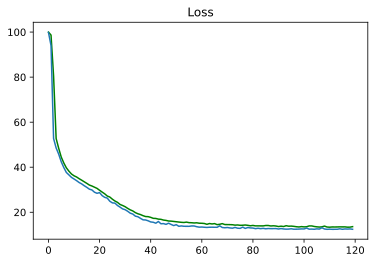

In [109]:
plt.title('Loss')
plt.plot(history.history['MAPE'], label='train', color='green')
plt.plot(history.history['val_MAPE'], label='test')
plt.show();

In [110]:
model4.load_weights(DATA_DIR + '/checkpoints/best_model4.hdf5')
model4.save(DATA_DIR + '/checkpoints/nlp_multiple_inputs.hdf5')

In [111]:
model4_predict_test = model4.predict([text_test_sequences, X_test])
print(f"TEST mape: {(mape(y_test, model4_predict_test[:,0]))*100:0.2f}%")

TEST mape: 12.45%


In [112]:
model4_predict_sub = model4.predict([text_sub_sequences, X_sub])
sample_submission['price'] = model4_predict_sub
sample_submission.to_csv(DATA_DIR + '/submissions/submission_model4_nlp_multiple_inputs.csv', index=False)

**Summary:**  
Accuracy **NLP + Multiple Inputs** with MAPE: 12.45% (native MAPE: 19.88%)

# Model 5: NLP + images

### Preview

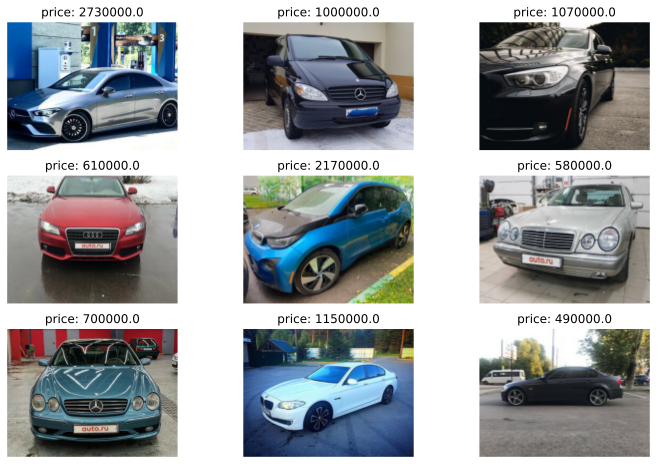

In [113]:
# preview images
plt.figure(figsize = (12,8))

random_image = train.sample(n = 9)
random_image_paths = random_image['sell_id'].values
random_image_cat = random_image['price'].values

for index, path in enumerate(random_image_paths):
    im = PIL.Image.open(DATA_DIR+'/img/img/' + str(path) + '.jpg')
    plt.subplot(3, 3, index + 1)
    plt.imshow(im)
    plt.title('price: ' + str(random_image_cat[index]))
    plt.axis('off')
plt.show()

In [ ]:
#X_train = X_train[:50]
#X_test = X_test[:10]
#X_sub = X_sub[:16]

In [ ]:
#y_train = y_train[:50]
#y_test = y_test[:10]

In [114]:
size = (160, 120)

def get_image_array(index):
    images_train = []
    for index, sell_id in enumerate(data['sell_id'].iloc[index].values):
        image = cv2.imread(DATA_DIR + 'img/img/' + str(sell_id) + '.jpg')
        assert(image is not None)
        image = cv2.resize(image, size)
        images_train.append(image)
    images_train = np.array(images_train)
    print('images shape', images_train.shape, 'dtype', images_train.dtype)
    return(images_train)

images_train = get_image_array(X_train.index)
images_test = get_image_array(X_test.index)
images_sub = get_image_array(X_sub.index)

images shape (5679, 120, 160, 3) dtype uint8
images shape (1003, 120, 160, 3) dtype uint8
images shape (1671, 120, 160, 3) dtype uint8


### Augmentation

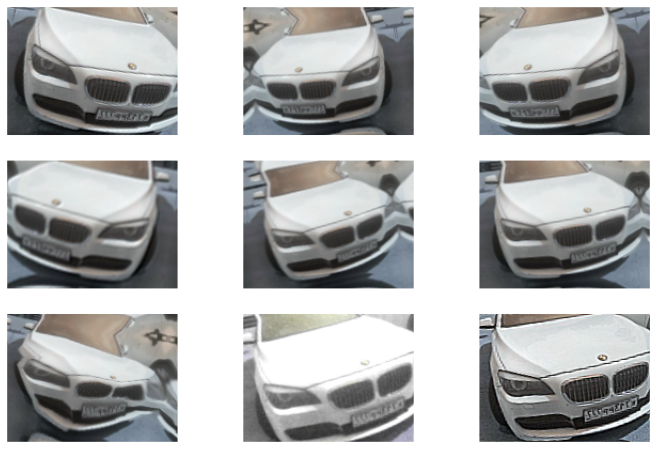

In [115]:
from albumentations import (
    HorizontalFlip, IAAPerspective, ShiftScaleRotate, CLAHE, RandomRotate90,
    Transpose, ShiftScaleRotate, Blur, OpticalDistortion, GridDistortion, HueSaturationValue,
    IAAAdditiveGaussianNoise, GaussNoise, MotionBlur, MedianBlur, IAAPiecewiseAffine,
    IAASharpen, IAAEmboss, RandomBrightnessContrast, Flip, OneOf, Compose
)


# https://albumentations.readthedocs.io/en/latest/examples.html
augmentation = Compose([
    HorizontalFlip(),
    OneOf([
        IAAAdditiveGaussianNoise(),
        GaussNoise(),
    ], p=0.2),
    OneOf([
        MotionBlur(p=0.2),
        MedianBlur(blur_limit=3, p=0.1),
        Blur(blur_limit=3, p=0.1),
    ], p=0.2),
    ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=1),
    OneOf([
        OpticalDistortion(p=0.3),
        GridDistortion(p=0.1),
        IAAPiecewiseAffine(p=0.3),
    ], p=0.2),
    OneOf([
        CLAHE(clip_limit=2),
        IAASharpen(),
        IAAEmboss(),
        RandomBrightnessContrast(),
    ], p=0.3),
    HueSaturationValue(p=0.3),
], p=1)

# preview
plt.figure(figsize = (12,8))
for i in range(9):
    img = augmentation(image = images_train[0])['image']
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

In [116]:
# APPLY TOKENIZER
# The maximum number of words to be used. (most frequent)
MAX_WORDS = 100000
# Max number of words in each complaint.
MAX_SEQUENCE_LENGTH = 256

In [117]:
# NLP part
tokenize = Tokenizer(num_words=MAX_WORDS)
tokenize.fit_on_texts(data.description)

### Using tf.data.Dataset
Use for avoid memory limits

In [118]:
def process_image(image):
    return augmentation(image = image.numpy())['image']

def tokenize_(descriptions):
  return sequence.pad_sequences(tokenize.texts_to_sequences(descriptions), maxlen = MAX_SEQUENCE_LENGTH)

def tokenize_text(text):
    return tokenize_([text.numpy().decode('utf-8')])[0]

def tf_process_train_dataset_element(image, table_data, text, price):
    im_shape = image.shape
    [image,] = tf.py_function(process_image, [image], [tf.uint8])
    image.set_shape(im_shape)
    [text,] = tf.py_function(tokenize_text, [text], [tf.int32])
    return (image, table_data, text), price

def tf_process_val_dataset_element(image, table_data, text, price):
    [text,] = tf.py_function(tokenize_text, [text], [tf.int32])
    return (image, table_data, text), price

train_dataset = tf.data.Dataset.from_tensor_slices((
    images_train, X_train, data.description.iloc[X_train.index], y_train
    )).map(tf_process_train_dataset_element)

test_dataset = tf.data.Dataset.from_tensor_slices((
    images_test, X_test, data.description.iloc[X_test.index], y_test
    )).map(tf_process_val_dataset_element)

y_sub = np.zeros(len(X_sub))
sub_dataset = tf.data.Dataset.from_tensor_slices((
    images_sub, X_sub, data.description.iloc[X_sub.index], y_sub
    )).map(tf_process_val_dataset_element)

# check that there are no errors:
train_dataset.__iter__().__next__();
test_dataset.__iter__().__next__();
sub_dataset.__iter__().__next__();

### Convolutional Neural Network

In [119]:
# https://www.tensorflow.org/api_docs/python/tf/keras/applications/efficientnet/EfficientNetB0
# Instantiates the EfficientNetB0 architecture.
efficientnet_model = tf.keras.applications.efficientnet.EfficientNetB3(weights = 'imagenet', include_top = False, input_shape = (size[1], size[0], 3))

43950080/43941136 [==============================] - 1s 0us/step


In [120]:
efficientnet_model.trainable = True

# Fine-tune from this layer onwards
fine_tune_at = len(efficientnet_model.layers)//2

# Freeze all the layers before the `fine_tune_at` layer
for layer in efficientnet_model.layers[:fine_tune_at]:
    layer.trainable =  False

In [121]:
fine_tune_model  = Sequential()
fine_tune_model.add(efficientnet_model)
fine_tune_model.add(L.GlobalAveragePooling2D(),)

### Tabular NN

In [122]:
# TNN
tabular_model = Sequential([
    L.Input(shape = X.shape[1]),
    L.Dense(512, activation = 'relu'),
    L.Dropout(0.5),
    L.Dense(256, activation = 'relu'),
    L.Dropout(0.5),
    ])

### NLP

In [123]:
# NLP
nlp_model = Sequential([
    L.Input(shape=MAX_SEQUENCE_LENGTH, name="seq_description"),
    L.Embedding(len(tokenize.word_index)+1, MAX_SEQUENCE_LENGTH,),
    L.LSTM(256, return_sequences=True),
    L.Dropout(0.5),
    L.LSTM(128),
    L.Dropout(0.25),
    L.Dense(64),
    ])

### Combine model

In [124]:
combinedInput = L.concatenate([fine_tune_model.output, tabular_model.output, nlp_model.output])

# being our regression head
head = L.Dense(256, activation="relu")(combinedInput)
head = L.Dense(1,)(head)

model5 = Model(inputs=[fine_tune_model.input, tabular_model.input, nlp_model.input], outputs=head)
model5.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 seq_description (InputLayer)   [(None, 256)]        0           []                               
                                                                                                  
 embedding_1 (Embedding)        (None, 256, 256)     10135552    ['seq_description[0][0]']        
                                                                                                  
 input_2 (InputLayer)           [(None, 175)]        0           []                               
                                                                                                  
 lstm_2 (LSTM)                  (None, 256, 256)     525312      ['embedding_1[0][0]']            
                                                                                            

In [125]:
optimizer = tf.keras.optimizers.Adam(0.001)
model5.compile(loss='MAPE',optimizer=optimizer, metrics=['MAPE'])

### Run model

In [126]:
checkpoint = ModelCheckpoint(DATA_DIR + 'checkpoints/best_model5.hdf5', monitor=['val_MAPE'], verbose=0, mode='min')
earlystop = EarlyStopping(monitor='val_MAPE', patience=10, restore_best_weights=True,)
callbacks_list = [checkpoint, earlystop]

In [127]:
history = model5.fit(
      train_dataset.batch(50),
      epochs=100,
      validation_data = test_dataset.batch(50),
      callbacks=callbacks_list
   )

Epoch 1/100
114/114 [==============================] - 165s 1s/step - loss: 97.8401 - MAPE: 97.8401 - val_loss: 81.1414 - val_MAPE: 81.1414
Epoch 2/100
114/114 [==============================] - 125s 1s/step - loss: 53.5864 - MAPE: 53.5864 - val_loss: 46.3347 - val_MAPE: 46.3347
Epoch 3/100
114/114 [==============================] - 126s 1s/step - loss: 44.3859 - MAPE: 44.3859 - val_loss: 44.3911 - val_MAPE: 44.3911
Epoch 4/100
114/114 [==============================] - 125s 1s/step - loss: 41.1690 - MAPE: 41.1690 - val_loss: 60.1952 - val_MAPE: 60.1952
Epoch 5/100
114/114 [==============================] - 127s 1s/step - loss: 38.7693 - MAPE: 38.7693 - val_loss: 39.3434 - val_MAPE: 39.3434
Epoch 6/100
114/114 [==============================] - 127s 1s/step - loss: 37.2763 - MAPE: 37.2763 - val_loss: 35.8712 - val_MAPE: 35.8712
Epoch 7/100
114/114 [==============================] - 126s 1s/step - loss: 36.1346 - MAPE: 36.1346 - val_loss: 34.5710 - val_MAPE: 34.5710
Epoch 8/100
114/114 

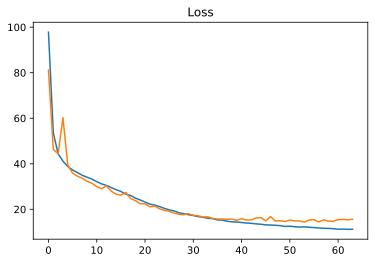

In [128]:
plt.title('Loss')
plt.plot(history.history['MAPE'], label='train')
plt.plot(history.history['val_MAPE'], label='test')
plt.show();

In [129]:
model5.load_weights(DATA_DIR + 'checkpoints/best_model5.hdf5')
model5.save(DATA_DIR + 'checkpoints/best_model5_nlp_images.hdf5')

In [131]:
model5_predict_test = model5.predict(test_dataset.batch(50))
print(f"TEST mape: {(mape(y_test, model5_predict_test[:,0]))*100:0.2f}%")

TEST mape: 15.62%


In [136]:
model5_predict_sub = model5.predict(sub_dataset.batch(50))
sample_submission['price'] = model5_predict_sub[:,0]
sample_submission.to_csv(DATA_DIR + '/submissions/submission_model5_nlp_images.csv', index=False)

**Summary:**  
Accuracy **NLP + images** with MAPE: 15.62% (native MAPE: 19.88%)

# Model 6: Blend

In [145]:
blend_predict = (model2_predict_test + model3_predict_test[:,0]) / 2
print(f"TEST mape: {(mape(y_test, blend_predict))*100:0.2f}%")

TEST mape: 11.72%


**Summary**:  
Accuracy **Blend** with MAPE: 11.27% (native MAPE: 19.88%)

In [146]:
blend_sub_predict = (model2_predict_sub + model3_predict_sub[:,0]) / 2
sample_submission['price'] = blend_sub_predict
sample_submission.to_csv(DATA_DIR + '/submissions/submission_blend.csv', index=False)

# Ppoject Summary


1. Выполнено очищение данных, EDA, обработка и подготовка.
2. Выполнена нормализация, использовались методы кодирования категориальных признаков. 
3. Созданы дополнительные признаки: 
4. Построены модели по обработке естественного языка (NLP)
5. Применен Fine-tuning метод обучения
6. Применены дополнительные методы предобработки (аугментация, лемматизация)
7. Добавление изображений в решение


**The best results give Blend (Model2: CatBoostRegressor + Model 3: Tabular NN)**